# Model 2 - RNN using both geo-spatial and kinematic features

In [2]:
%load_ext autoreload
%autoreload 2

import sys

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

sys.path.append('../dtu-deep-learning-project/src/')
from data_utils import *
clear_output(wait=False)

### Load train, validation and test data

In [3]:
user_train, user_val, user_test = train, val, test = train_test_data_split()

### Set time interval and speed cut off

In [4]:
seq_cutoff_speed = 45
seq_cutoff_time = 60
filter_seq = 5

In [5]:
data_train = pd.concat([create_data_frame(*load_user_data(user,load_web_mercator = True), segmentation=True, seq_cutoff_time = seq_cutoff_time, seq_cutoff_speed = seq_cutoff_speed) for user in user_train]).reset_index(drop=True)
data_val = pd.concat([create_data_frame(*load_user_data(user,load_web_mercator = True), segmentation=True, seq_cutoff_time = seq_cutoff_time, seq_cutoff_speed = seq_cutoff_speed) for user in user_val]).reset_index(drop=True)
data_test = pd.concat([create_data_frame(*load_user_data(user,load_web_mercator = True), segmentation=True, seq_cutoff_time = seq_cutoff_time, seq_cutoff_speed = seq_cutoff_speed) for user in user_test]).reset_index(drop=True)

In [6]:
data_train[(data_train['segment_ix'] >= filter_seq)].count()

user                   1147396
ts                     1147396
x                      1147396
y                      1147396
label                  1147396
image_ix               1147396
x_web                  1147396
y_web                  1147396
delta_t                1147396
delta_d                1147396
bearing                1147396
speed                  1147396
tod                    1147396
segment_id             1147396
segment_ix             1147396
segment_point_count    1147396
dtype: int64

In [7]:
plot_filtered(data_train[(data_train['segment_ix'] >= filter_seq)], 'speed')

#### Define Image Tensor Dataset

We implement our own Tensor Dataset in order to be able to do fast lookup of sequences and images.

In [12]:
class TensorDataset(torch.utils.data.Dataset):

    def __init__(self, df, filter_seq=filter_seq):
        self.seq = np.stack([np.roll(df[['delta_d', 'bearing']].values, i, axis = 0) for i in range(filter_seq, -1, -1)], axis = 1)
        self.seq = self.seq[df['segment_ix'] >= filter_seq]
        
        self.labels = df[df['segment_ix'] >= filter_seq]['label'].values        
        self.user_id = df[df['segment_ix'] >= filter_seq]['user'].values
        tod = df[df['segment_ix'] >= filter_seq]['tod'].values
        self.tod_one_hot = np.eye(5)[tod]
        
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, key):
        return self.seq[key], self.tod_one_hot[key], self.labels[key]   

## Example Input/output data from ``TensorDataset``

In [13]:
demo_dataset = TensorDataset(data_train)

for X_seq, X_tod, y in torch.utils.data.DataLoader(demo_dataset, batch_size=3, shuffle=True):
    print('X_seq :', X_seq.shape)
    print(X_seq[0, :])
    print('X_tod :', X_tod.shape)
    print(X_tod[0])
    print('y :', y.shape)
    print(y[0])
    break;

X_seq : torch.Size([3, 6, 2])
tensor([[0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.]], dtype=torch.float64)
X_tod : torch.Size([3, 5])
tensor([0., 1., 0., 0., 0.], dtype=torch.float64)
y : torch.Size([3])
tensor(1)


### Hyper Parameters

In [62]:
# Network Parameters
IMG_INPUT_H_W = 9, 9
IMG_INPUT_C = 11
TOD_INPUT_DIM = 6

SEQ_LENGTH = filter_seq+1
SEQ_FEATURES = 2
TOD_INPUT_DIM = 5
RNN_HIDDEN_DIM = 4
RNN_NUM_LAYERS = 2
RNN_BIDIRECT = True
FC_HIDDEN_DIM = 512
DROPOUT_PROP = 0.45

NUM_CLASSES = 2

# Training Parameters
NUM_EPOCH = 50
BATCH_SIZE = 12000
LEARNING_RATE = 0.1
LEARNING_DECAY_FACTOR = 0.1
LEARNING_DECAY_EPOCHS = [40]

#### Define Data Loaders

In [63]:
train_dataloader = torch.utils.data.DataLoader(TensorDataset(data_train), batch_size=BATCH_SIZE, shuffle=False, num_workers=8)
val_dataloader = torch.utils.data.DataLoader(TensorDataset(data_val), batch_size=BATCH_SIZE, shuffle=False, num_workers=8)
test_dataloader = torch.utils.data.DataLoader(TensorDataset(data_test), batch_size=BATCH_SIZE, shuffle=False, num_workers=8)

#### Define some utility functions for building and running the network

In [64]:
def adjust_lr(optimizer, epoch):
    number_decay_points_passed = np.sum(epoch >= np.array(LEARNING_DECAY_EPOCHS))
    lr = LEARNING_RATE * (LEARNING_DECAY_FACTOR ** number_decay_points_passed)
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr
    return lr

class SelectItem(nn.Module):
    def __init__(self, item_index):
        super(SelectItem, self).__init__()
        self._name = 'selectitem'
        self.item_index = item_index

    def forward(self, inputs):
        return inputs[self.item_index]

### Define network for Convolutional neural network (CNN) using only geo-spatial features

In [65]:
class CnnNet(nn.Module):

    def __init__(self):
        super(CnnNet, self).__init__()
        
        rnn_output_dim = SEQ_LENGTH*RNN_HIDDEN_DIM
        if RNN_BIDIRECT:
            rnn_output_dim *= 2
        
        self.rnn_layer = nn.Sequential(
            nn.GRU(SEQ_FEATURES, RNN_HIDDEN_DIM, RNN_NUM_LAYERS, batch_first=True, bidirectional=RNN_BIDIRECT),
            SelectItem(0),
            nn.Flatten(start_dim=1),
            nn.BatchNorm1d(rnn_output_dim),
            nn.ReLU(),
            nn.Dropout(DROPOUT_PROP)
        )
        self.fc_layer = nn.Sequential(
            nn.Linear(TOD_INPUT_DIM + rnn_output_dim, FC_HIDDEN_DIM),
            nn.BatchNorm1d(FC_HIDDEN_DIM),
            nn.ReLU(),
            nn.Dropout(DROPOUT_PROP),
            nn.Linear(FC_HIDDEN_DIM, FC_HIDDEN_DIM//5),
            nn.BatchNorm1d(FC_HIDDEN_DIM//5),
            nn.ReLU(),
            nn.Dropout(DROPOUT_PROP),
            nn.Linear(FC_HIDDEN_DIM//5, NUM_CLASSES),
            #nn.BatchNorm1d(NUM_CLASSES),
            #nn.ReLU(),
            #nn.Dropout(DROPOUT_PROP)
        )
        #print(CNN_HIDDEN_DIM_2 * h * w + TOD_INPUT_DIM + rnn_output_dim)      

    def forward(self, X_seq, X_tod):
        out_seq = self.rnn_layer(X_seq)
        #print(f'5     {X_seq.shape}')
        out = torch.cat([out_seq, X_tod], dim=1)
        #print(f'6     {out.shape}')
        out = self.fc_layer(out)
        
        return out

#### Define class weights due to large class im-balance

In [66]:
class_weights = [(data_train['label'] == 0).sum()/(data_train['label'] == x).sum() for x in range(NUM_CLASSES)]
class_weights

[1.0, 0.36125205657481785]

#### Define model, optimizer and loss

In [67]:
device = torch.device('cuda:1') # PyTorch v0.4.0
model = CnnNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-10)
criterion = nn.CrossEntropyLoss(weight = torch.Tensor(class_weights).to(device))

#### Number of parameters

In [68]:
np.sum([np.product(x.cpu().detach().numpy().shape) for x in model.parameters()])

82032

#### Test input/output of model

In [69]:
out = model(X_seq.to(device, dtype=torch.float), X_tod.to(device, dtype=torch.float))
print(out.shape)

torch.Size([3342, 2])


In [70]:
out[:2].cpu()

tensor([[ 0.3159, -0.1138],
        [ 0.2422,  0.1799]], grad_fn=<CopyBackwards>)

In [71]:
phases = {
    'train': {
        'dataloader': train_dataloader,
        'is_training': True,
    },
    'validation': {
        'dataloader': val_dataloader,
        'is_training': False,
    },
    'test': {
        'dataloader': test_dataloader,
        'is_training': False,
    }
}

### Train / Validation loop

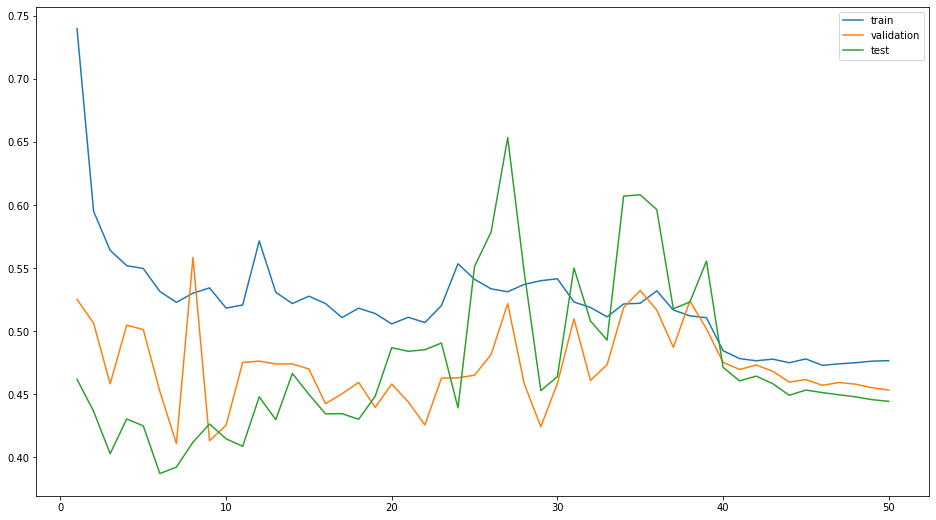

In [72]:
for epoch in range(1, NUM_EPOCH + 1):
    
    for phase_name, phase in phases.items():
        epoach_loss = 0.0
                
        phase_is_training = phase['is_training']
        phase_dataloader = phase['dataloader']
        model.train(phase_is_training)
        
        # Ajust and save the learning rate in the phase dict
        if phase_is_training:
            lr = adjust_lr(optimizer, epoch)
            phase.setdefault('lr', []).append(lr)
            
        # Iterate over each bath in the phase
        for i, batch in enumerate(phase_dataloader, 1):
            #print(i)
            #print(batch[0].shape)
            X_seq, X_tod, y = batch
            

            X_seq = X_seq.to(device, dtype=torch.float)
            X_tod = X_tod.to(device, dtype=torch.float)
            y = y.to(device, dtype=torch.int64)

            with torch.set_grad_enabled(phase_is_training):
                out = model(X_seq, X_tod)
                loss = criterion(out, y)

            if phase_is_training:
                optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_value_(model.parameters(), 0.5)
                optimizer.step()
        
            epoach_loss += loss.item()
        
        # Save the loss for the epoch in the phase dict
        phase.setdefault('loss', []).append(epoach_loss/i)
        
    clear_output(wait=True)
    fig, ax = plt.subplots(figsize = (16, 9))
    #ax.set_yscale('log')
    
    for phase_name, phase in phases.items():
        ax.plot(np.arange(1, epoch + 1), phase['loss'], label = phase_name)        
    
    ax.legend()
    plt.show();            

### Validation/Test prediction loop

In [73]:
for phase_name, phase in phases.items():
    if phase['is_training']: 
        continue
    
    phase_dataloader = phase['dataloader']
    phase['predicted'] = []
    phase['true'] = []
    
    for i, batch in enumerate(phase_dataloader, 1):
        X_seq, X_tod, y = batch

        phase['true'].extend(list(y.numpy()))
        
        X_seq = X_seq.to(device, dtype=torch.float)
        X_tod = X_tod.to(device, dtype=torch.float)
        y = y.to(device, dtype=torch.float)
        
        with torch.no_grad():
            out = model(X_seq, X_tod)
            probability, predicted = torch.max(out, 1)
            
        phase['predicted'].extend(list(predicted.cpu().numpy()))        

### Final results

In [74]:
for phase_name, phase in phases.items():
    if phase['is_training']: 
        continue
    
    print(phase_name)
    print(classification_report(phase['true'], phase['predicted'], target_names = ['Motion','Stop']))

validation
              precision    recall  f1-score   support

      Motion       0.72      0.87      0.78     43225
        Stop       0.91      0.80      0.85     72339

    accuracy                           0.82    115564
   macro avg       0.81      0.83      0.82    115564
weighted avg       0.84      0.82      0.82    115564

test
              precision    recall  f1-score   support

      Motion       0.59      0.89      0.71     42456
        Stop       0.96      0.79      0.86    122886

    accuracy                           0.82    165342
   macro avg       0.77      0.84      0.79    165342
weighted avg       0.86      0.82      0.83    165342



In [45]:
dd = data_test[data_test['segment_ix'] >= filter_seq]

In [46]:
dd['pred']=phase['predicted']

/home/valse/data_valse/tf/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [47]:
plot_filtered(dd, 'pred')

In [48]:
plot_filtered(dd, 'label')